# Tutorial: BedMachine with Python

Created on 5 October 2023.

This is a tutorial on **loading, preprocessing and visualising BedMachine data with Python**. I hope it can also be of use for loading similar .nc (netCDF) polar climate data sets (see [my GitHub repository](https://github.com/kimbente/antarctica-data-sets) for other Antarctica data sets) or more generally, spatial data.

## Packages
- xarray
- plotly
  - plotly.express
  - plotly.graph_objects
- torch
- pyproj
- cartopy

For me a Python 3.9 environment works.

## Potential sources of confusion

Different packages and functions were developed for datatypes like images, matrices, tensors, or gridded spatial data, who all have special conventions. While we can utilise many such packages and functions for our data set, particularly the following two conventions change across them:

- Location of origin of the coordinate system e.g. lower (lower left corner) or upper (upper left corner).
- x, y (~longitude, latitude) / y, x (~latitude, longitude) order

Firstly, we load all packages.

In [1]:
import xarray as xr

import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'notebook'

import torch
import pyproj
import numpy as np

import cartopy.crs as ccrs  # Projections list
import cartopy.feature as cfeature # for coastlines

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches # draw domain boundry patches
from matplotlib.colors import LightSource # for hillshade/shape
from matplotlib.colors import ListedColormap # to make my own colormap
# import cmocean

# to extract versions of packages used
import watermark

# Data in xarray

Data: [MEaSUREs BedMachine Antarctica, Version 3](https://nsidc.org/data/nsidc-0756/versions/3)  
User guide: [Link to pdf](https://nsidc.org/sites/default/files/documents/user-guide/nsidc-0756-v003-userguide.pdf)

Download the data from the US National Snow and Ice Data Center (NSIDC) to your machine. We then load it into an xarray object.
The data set contains bathymetry and bed topography.

In [108]:
# Load with xarray, change path
path_to_file_local = "/Users/kimbente/Desktop/Bayesian Optimisation/BO-ANT-project/raw-data/BedMachine_v3/BedMachineAntarctica-v3.nc"
path_to_file_server = "/Users/kimbente/BedMachineAntarctica-v3.nc"

xr_bedmachine = xr.open_dataset(path_to_file_local)

# Look at data
xr_bedmachine

<xarray.Dataset>
Dimensions:    (x: 13333, y: 13333)
Coordinates:
  * x          (x) int32 -3333000 -3332500 -3332000 ... 3332000 3332500 3333000
  * y          (y) int32 3333000 3332500 3332000 ... -3332000 -3332500 -3333000
Data variables:
    mapping    |S1 ...
    mask       (y, x) int8 ...
    firn       (y, x) float32 ...
    surface    (y, x) float32 ...
    thickness  (y, x) float32 ...
    bed        (y, x) float32 ...
    errbed     (y, x) float32 ...
    source     (y, x) int8 ...
    dataid     (y, x) int8 ...
    geoid      (y, x) int16 ...
Attributes: (12/17)
    Conventions:                 CF-1.7
    Title:                       BedMachine Antarctica
    Author:                      Mathieu Morlighem
    version:                     03-Jun-2022 (v3.4)
    nx:                          13333.0
    ny:                          13333.0
    ...                          ...
    ymax:                        3333000
    spacing:                     500
    no_data:                     -9999.0
    license:                     No restrictions on access or use
    Data_citation:               Morlighem M. et al., (2019), Deep glacial tr...
    Notes:                       Data processed at the Department of Earth Sy...

Observations:
- y coordinates are ordered high to low.
- x coordinates are ordered low to high.
  - i.e. the data starts in the top left corner, far from the ice sheet in the Southern ocean
- Data variables like bed elevation or surface elevation are indexed in (y, x) order.
- Coordinates refer to the centroids of grid cells.

Notes on xarray:
- There are differences between xarray.Datasets and xarray.DataArrays
- There are differences between dims, vars and coords. Reassignment can help to delete unused dimensions.

Let's learn how to extract data from the xarray object:

In [3]:
# This is how you extract the 1D array of all y coordinate values:
# xr_bedmachine.coords["y"].values
print("Shape of y coordinate array:", xr_bedmachine.coords["y"].values.shape)

# This is how you extract the  2D array of all bed elevation values:
# xr_bedmachine["bed"].values
print("Shape of bed elevation array:", xr_bedmachine["bed"].values.shape)

Shape of y coordinate array: (13333,)
Shape of bed elevation array: (13333, 13333)


## Subset grounded ice

We create a new variable called xr_bedmachine.bed_land where we fill grid cells with non grounded ice with nan. This is useful for visualisation, if we want to focus on grounded ice. 

First, let's take a look what proportion of the data set represent grounded ice

In [10]:
# 2 is land
count_array, bin_array = np.histogram(xr_bedmachine["mask"].values.reshape(-1), bins = [0, 1, 2, 3, 4, 5])
print(np.round(count_array/count_array.sum(), 3))

print("The proportion of BedMachine that covers grounded ice is", np.round((count_array/count_array.sum())[2], 2))

[0.694 0.002 0.27  0.034 0.   ]
The proportion of BedMachine that covers grounded ice is 0.27


In [11]:
# Make copy of bed data
xr_bedmachine["bed_land"] = xr_bedmachine.bed

# Will with nan if not grounded ice
xr_bedmachine.bed_land.values[(xr_bedmachine["mask"] != 2).values] = np.nan

# Check that this worked
# Range of bed values
np.nanmin(xr_bedmachine.bed_land.values), np.nanmax(xr_bedmachine.bed_land.values)

(-3827.196, 4729.875)

## Mega dunes in East Antarctica
### Subset one 100 x 100 scene by coordinates

We now only want to select a 100 x 100 scene that we will visualise in the following. We use `.sel` to subset the data set by (Polar Stereographic) coordinate values.

In [12]:
# Define H/W size of scene in meters (unit of the coordinate system.)
# While the scene is 100 pixel wide x 500 meter resolution = 50,000 m = 50.0 km wide and high,
# the grid cell centroids on the outer boundries of the scene will only be 
# 49500 m apart (250 meters inwards from either side)
wave_scene_size = 49500

# Select y-coordinate (lower edge)
wave_scene_y_min = - 601500
# (upper edge)
wave_scene_y_max = wave_scene_y_min + wave_scene_size
print("(y min coordinate, y max coordinate): ", wave_scene_y_min, ",", wave_scene_y_max)

# Select x-coordinate (left edge)
wave_scene_x_min = 1034000 
# (right edge)
wave_scene_x_max = wave_scene_x_min + wave_scene_size
print("(x min coordinate, x max coordinate): ", wave_scene_x_min, ",", wave_scene_x_max)

# !! y slicing is ordered y_max, y_min, cooresponding to high to low ordering of coordinate index.
xr_bedmachine_scene_wave_100px = xr_bedmachine.sel(y = slice(wave_scene_y_max, wave_scene_y_min),
                                        x = slice(wave_scene_x_min, wave_scene_x_max))
# Look at subsetted data set
xr_bedmachine_scene_wave_100px

(y min coordinate, y max coordinate):  -601500 , -552000
(x min coordinate, x max coordinate):  1034000 , 1083500


<xarray.Dataset>
Dimensions:    (x: 100, y: 100)
Coordinates:
  * x          (x) int32 1034000 1034500 1035000 ... 1082500 1083000 1083500
  * y          (y) int32 -552000 -552500 -553000 ... -600500 -601000 -601500
Data variables:
    mapping    |S1 ...
    mask       (y, x) int8 2 2 2 2 2 2 2 2 2 2 2 2 2 ... 2 2 2 2 2 2 2 2 2 2 2 2
    firn       (y, x) float32 ...
    surface    (y, x) float32 ...
    thickness  (y, x) float32 ...
    bed        (y, x) float32 9.606 9.756 9.616 9.321 ... -64.81 -65.57 -66.48
    errbed     (y, x) float32 ...
    source     (y, x) int8 ...
    dataid     (y, x) int8 ...
    geoid      (y, x) int16 ...
    bed_land   (y, x) float32 9.606 9.756 9.616 9.321 ... -64.81 -65.57 -66.48
Attributes: (12/17)
    Conventions:                 CF-1.7
    Title:                       BedMachine Antarctica
    Author:                      Mathieu Morlighem
    version:                     03-Jun-2022 (v3.4)
    nx:                          13333.0
    ny:                          13333.0
    ...                          ...
    ymax:                        3333000
    spacing:                     500
    no_data:                     -9999.0
    license:                     No restrictions on access or use
    Data_citation:               Morlighem M. et al., (2019), Deep glacial tr...
    Notes:                       Data processed at the Department of Earth Sy...

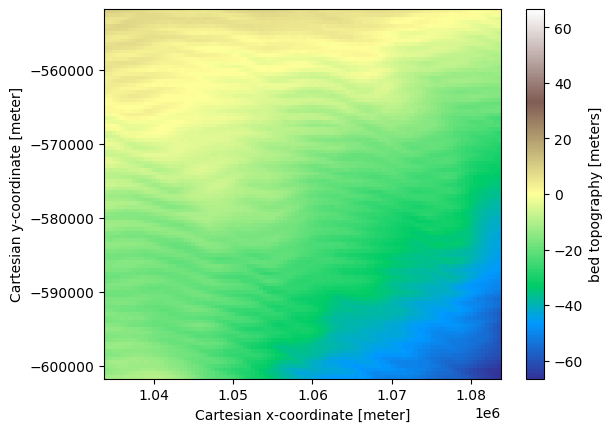

In [20]:
# Inbuilt plotting function with terrain cmap (default terrain colormap)
xr_bedmachine_scene_wave_100px.bed_land.plot(cmap = "terrain")

The waves are only very subtle.

# Custom bedmachine colormap

- We create a custom colormaps to match BedMachine's visualisations.
- The global scale maps use [vmin = -2000, vmax = 1000] which is smaller than the range of the values and thus results in some oversaturation. The range of bed elevation values for grounded ice is [-3827.196, 4729.875].

In [14]:
cvals  = [-2000, -1500, -1000, -500, -1,
           0, 
          1, 250, 500, 750, 1000]

colors = ["#001079", "#0023c1", "#006cef", "#47bdfc", "#bee6fa", 
          "#7eb3a1",
          "#2D6E2A", "#DFFBBC", "#AFAD48", "#7D5F18", "#481B02"]

# Create a colormap object
norm = plt.Normalize(np.min(cvals), np.max(cvals))
tuples = list(zip(map(norm, cvals), colors))

bedmachine_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", tuples)

# Visualise larger scenes for an overview
## Denham glacier 800 px

(y min coordinate, y max coordinate):  -536500 , -137000
(x min coordinate, x max coordinate):  2260000 , 2659500


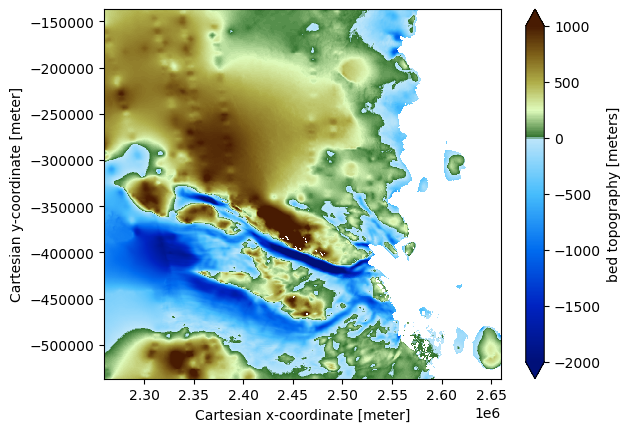

In [23]:
scene_size = 399500 # 400 km are 800 x 800 pixels
i = 7 # go up (16 x axis for 200 km)
j = 14 # go right

# Select y-coordinate (lower edge)
scene_y_min = -3333000 + i * scene_size
# (upper edge)
scene_y_max = scene_y_min + scene_size
print("(y min coordinate, y max coordinate): ", scene_y_min, ",", scene_y_max)

# Select x-coordinate (left edge)
scene_x_min = -3333000 + j * scene_size
# (right edge)
scene_x_max = scene_x_min + scene_size
print("(x min coordinate, x max coordinate): ", scene_x_min, ",", scene_x_max)

# !! y slicing is ordered y_max, y_min, cooresponding to high to low ordering of coordinate index.
xr_bedmachine_newscene_denham_800px = xr_bedmachine.sel(y = slice(scene_y_max, scene_y_min),
                                        x = slice(scene_x_min, scene_x_max))

xr_bedmachine_newscene_denham_800px.bed_land.plot(cmap = bedmachine_cmap, vmin = -2000, vmax = 1000)

Note the minor issues in the areas of radar measurements

## Visualise the continent in 6 x 6 2000px tiles
### Gambutsev example

(y min coordinate, y max coordinate):  -334500 , 665000
(x min coordinate, x max coordinate):  665000 , 1664500


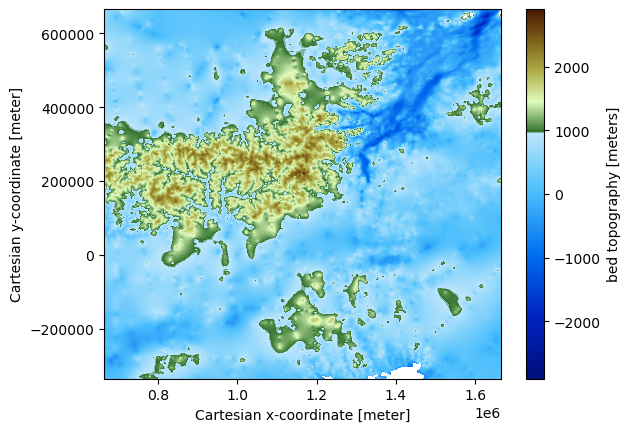

In [29]:
scene_size = 999500 # 1000 km are 2000 x 2000 pixels
i = 3 # go up
j = 4 # go right

# Select y-coordinate (lower edge)
scene_y_min = -3333000 + i * scene_size
# (upper edge)
scene_y_max = scene_y_min + scene_size
print("(y min coordinate, y max coordinate): ", scene_y_min, ",", scene_y_max)

# Select x-coordinate (left edge)
scene_x_min = -3333000 + j * scene_size
# (right edge)
scene_x_max = scene_x_min + scene_size
print("(x min coordinate, x max coordinate): ", scene_x_min, ",", scene_x_max)

# !! y slicing is ordered y_max, y_min, cooresponding to high to low ordering of coordinate index.
xr_bedmachine_newscene = xr_bedmachine.sel(y = slice(scene_y_max, scene_y_min),
                                        x = slice(scene_x_min, scene_x_max))
# Look at subsetted data set
xr_bedmachine_newscene

# We don't define vmin and vmax, so the color scale is based on the data values.
xr_bedmachine_newscene.bed_land.plot(cmap = bedmachine_cmap)

### Byrd glacier at 400 x 400 px

(y min coordinate, y max coordinate):  -1025000 , -825500
(x min coordinate, x max coordinate):  300000 , 499500


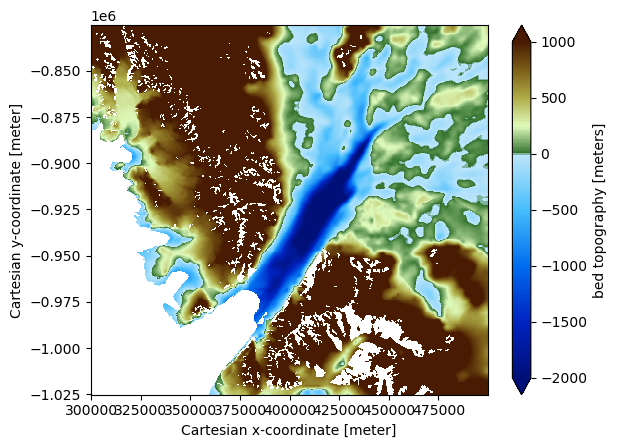

In [54]:
scene_size = 199500 # 200 km are 400 x 400 pixels

# Select y-coordinate (lower edge)
scene_y_min = -1025000
# (upper edge)
scene_y_max = scene_y_min + scene_size
print("(y min coordinate, y max coordinate): ", scene_y_min, ",", scene_y_max)

# Select x-coordinate (left edge)
scene_x_min = 300000
# (right edge)
scene_x_max = scene_x_min + scene_size
print("(x min coordinate, x max coordinate): ", scene_x_min, ",", scene_x_max)

# !! y slicing is ordered y_max, y_min, cooresponding to high to low ordering of coordinate index.
xr_bedmachine_newscene = xr_bedmachine.sel(y = slice(scene_y_max, scene_y_min),
                                        x = slice(scene_x_min, scene_x_max))
# Look at subsetted data set
xr_bedmachine_newscene

# the bedmachine_cmap heavily oversaturates
# xr_bedmachine_newscene.bed_land.plot(cmap = bedmachine_cmap, vmin = -2000, vmax = 1000)
xr_bedmachine_newscene.bed.plot(cmap = bedmachine_cmap, vmin = -2000, vmax = 1000)

# Continent-wide visualisation

- This might take a minute to render

In [51]:
scene_size = 5500000 # 5500 km wide

# Select y-coordinate (lower edge)
scene_y_min = -2200000 
# (upper edge)
scene_y_max = scene_y_min + scene_size
print("(y min coordinate, y max coordinate): ", scene_y_min, ",", scene_y_max)

# Select x-coordinate (left edge)
scene_x_min = -2700000 # leftmost boundry
# (right edge)
scene_x_max = scene_x_min + scene_size
print("(x min coordinate, x max coordinate): ", scene_x_min, ",", scene_x_max)

# !! y slicing is ordered y_max, y_min, cooresponding to high to low ordering of coordinate index.
xr_bedmachine_continent = xr_bedmachine.sel(y = slice(scene_y_max, scene_y_min),
                                        x = slice(scene_x_min, scene_x_max))
# Look at subsetted data set
xr_bedmachine_continent

# xr_bedmachine_newscene.bed_land.plot(cmap = bedmachine_cmap, vmin = -2000, vmax = 1000, figsize = (35, 30), aspect = 1.0)

(y min coordinate, y max coordinate):  -2200000 , 3300000
(x min coordinate, x max coordinate):  -2700000 , 2800000


<xarray.Dataset>
Dimensions:    (x: 11001, y: 11001)
Coordinates:
  * x          (x) int32 -2700000 -2699500 -2699000 ... 2799000 2799500 2800000
  * y          (y) int32 3300000 3299500 3299000 ... -2199000 -2199500 -2200000
Data variables:
    mapping    |S1 ...
    mask       (y, x) int8 0 0 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0 0
    firn       (y, x) float32 ...
    surface    (y, x) float32 ...
    thickness  (y, x) float32 ...
    bed        (y, x) float32 nan nan nan nan nan nan ... nan nan nan nan nan
    errbed     (y, x) float32 ...
    source     (y, x) int8 ...
    dataid     (y, x) int8 ...
    geoid      (y, x) int16 ...
    bed_land   (y, x) float32 nan nan nan nan nan nan ... nan nan nan nan nan
Attributes: (12/17)
    Conventions:                 CF-1.7
    Title:                       BedMachine Antarctica
    Author:                      Mathieu Morlighem
    version:                     03-Jun-2022 (v3.4)
    nx:                          13333.0
    ny:                          13333.0
    ...                          ...
    ymax:                        3333000
    spacing:                     500
    no_data:                     -9999.0
    license:                     No restrictions on access or use
    Data_citation:               Morlighem M. et al., (2019), Deep glacial tr...
    Notes:                       Data processed at the Department of Earth Sy...

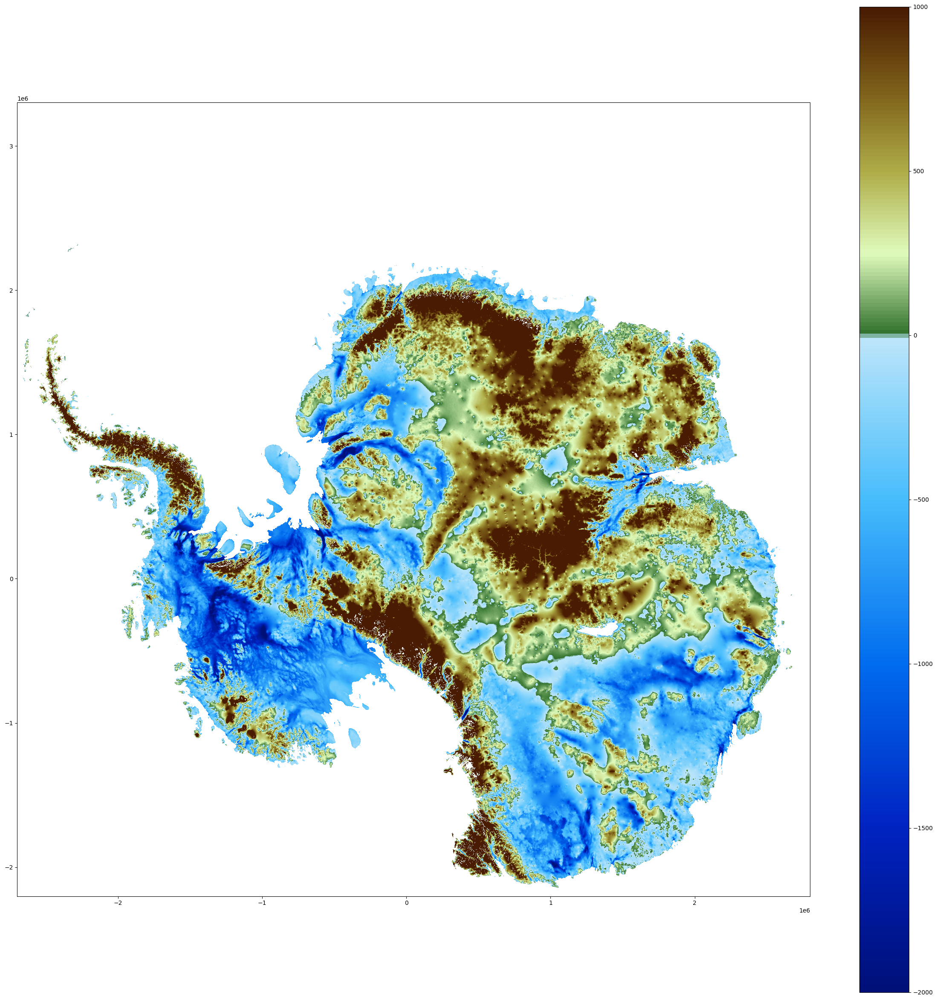

In [52]:
XX, YY = np.meshgrid(xr_bedmachine_continent.x, xr_bedmachine_continent.y)

fig, ax = plt.subplots(figsize = (30, 30))
ax.pcolormesh(XX, YY, xr_bedmachine_continent.bed_land, cmap = bedmachine_cmap, vmin = -2000, vmax = 1000)
fig.colorbar(mappable = ax.collections[0], ax = ax)
ax.set_aspect('equal')

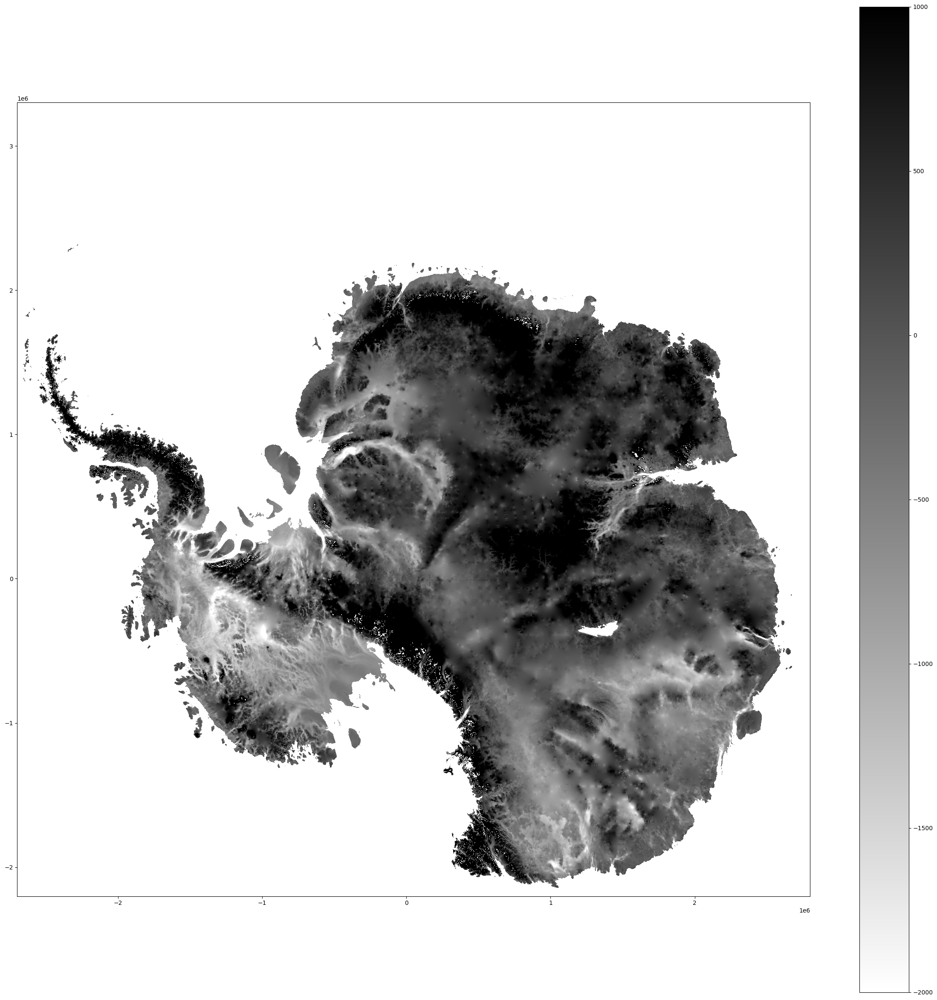

In [57]:
XX, YY = np.meshgrid(xr_bedmachine_continent.x, xr_bedmachine_continent.y)

fig, ax = plt.subplots(figsize = (30, 30))
ax.pcolormesh(XX, YY, xr_bedmachine_continent.bed_land, cmap = 'binary', vmin = -2000, vmax = 1000)
fig.colorbar(mappable = ax.collections[0], ax = ax)
ax.set_aspect('equal')

# Terrain mapping colormaps

Beautiful colormaps are in this package:
https://matplotlib.org/cmocean/

# Custom colorscale

In [65]:
cvals  = [0., 0.15, 0.3, 0.45, 0.5, 1.]
colors = ["#371229", "#B6222B", "#FF8E35", "#FCDC79", "white", "#62C3DB"]

norm = plt.Normalize(np.min(cvals), np.max(cvals))
tuples = list(zip(map(norm, cvals), colors))
nasa_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", tuples)

# Heatmap requres a colorscale with a list of tuples
nasa_cscale = [(0,"#371229"),(0.15,"#B6222B"),(0.3,"#FF8E35"),(0.45,"#FCDC79"),(0.5,"white"), (1,"#62C3DB")]

In [60]:
cvals  = [0., 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.]
colors = ["#8a4301", "#b46b1c", "#ff9a31", "#ffb822", "#f7e9a7", "#fcf5e4",
          "#e3c5b2", "#b26545", "#b0392e", "#641e16", "#4b1f09"]

norm = plt.Normalize(np.min(cvals), np.max(cvals))
tuples = list(zip(map(norm, cvals), colors))
my_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", tuples)

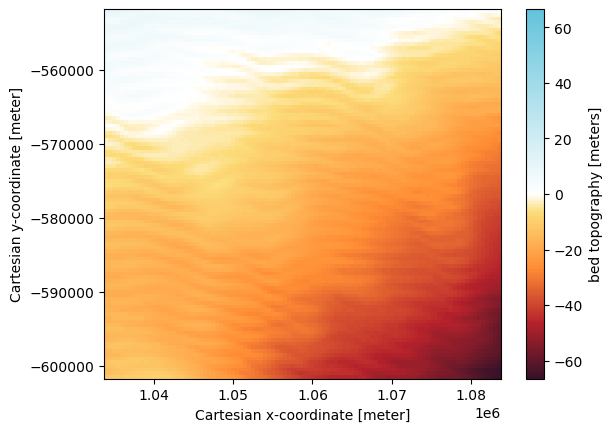

In [66]:
xr_bedmachine_scene_wave_100px.bed.plot(cmap = nasa_cmap)

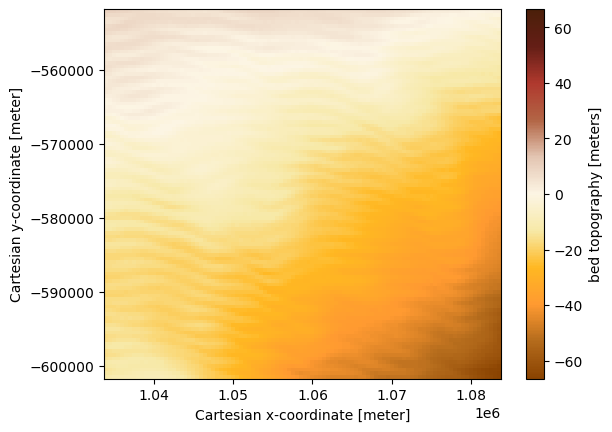

In [39]:
xr_bedmachine_scene_wave_100px.bed.plot(cmap = my_cmap)

# Convert to torch (PyTorch) tensor

We choose to now extract the variables of interest and convert them to a PyTorch tensor. PyTorch is a popular deep learning package and it has many useful e.g. Computer Vision algorithms implemented. Images (i.e. scenes) in torch are usually retresented as [N, C, H, W] tensors, where N is the number of images (here N = 1), C is the number of channels, H is the dimensionality in Height direction, and W is the dimensionality in Width direction.

We will only extract the **bed elevation** values, the **surface elevation** values and the **y and x coordinates**. We concatinate them into a [C, H, W] tensor with C = 4. Using `.unsqueeze()` to create explicit dimensions (extra dimensionality 1), we can convert it into a [N, C, H, W] tensor of shape [1, 4, 100, 100], where 

- `[:, 0, :, :]` is the bed elevation channel.
- `[:, 1, :, :]` is the surface elevation channel.
- `[:, 2, :, :]` is the y coordinate channel.
- `[:, 3, :, :]` is the x coordinate channel.

In [67]:
# Extract X or y dimensionality
scene_dimensions = len(xr_bedmachine_scene_wave_100px.coords["x"].values)

scene_tensor = torch.cat((torch.tensor(xr_bedmachine_scene_wave_100px.bed.values).unsqueeze(0), 
                          # Convert to tensor and create explicit first dimension to enable concatination.
                          torch.tensor(xr_bedmachine_scene_wave_100px.surface.values).unsqueeze(0),
                          # YX order
                          # Copy 1D y column vectors for all columns (all x values) to create a 2D field.
                          torch.tensor(xr_bedmachine_scene_wave_100px.coords["y"].values).unsqueeze(-1).repeat(1, scene_dimensions).unsqueeze(0),
                          # Copy 1D x row vectors for all rows (all y values)
                          torch.tensor(xr_bedmachine_scene_wave_100px.coords["x"].values).repeat(scene_dimensions, 1).unsqueeze(0)),
                          # Concatinate along first (index 0) dim
                          dim = 0).unsqueeze(0)

# Tensors have no names for dims. Common tensor shape is N, C, H, W
scene_tensor.shape

# Can be saved as .pt file

torch.Size([1, 4, 100, 100])

# 2D visualisation with plotly express

We use imshow() (image show) from plotly express.

In [68]:
# Use matplotlib colorscaled in Plotly

# Good colorscales from matplotlib
# plt.cm.winter
# plt.cm.summer
# plt.cm.cubehelix
# plt.cm.ocean

# Extract 5 colors from colormap
winter_cmap = matplotlib.cm.get_cmap('winter', 5)

for i in range(winter_cmap.N):
    rgba = winter_cmap(i)
    print(matplotlib.colors.rgb2hex(rgba))

winter_color_continuous_scale = [[0, '#0000ff'], [0.25, '#0040df'], [0.5, '#0080bf'], [0.75, '#00bf9f'], [1, '#00ff80']]

#0000ff
#0040df
#0080bf
#00bf9f
#00ff80


In [69]:
# Visualising only the surface elevation channel: Select first & only (index 0) image and second (index 1) channel.
px.imshow(scene_tensor[0, 1],
          color_continuous_scale = "ice",
          # color_continuous_scale = winter_color_continuous_scale,
          labels = dict(x = "x index", y = "y index"),
          title = "Surface elevation of one East Antarctic scene, using z values only")

Observation:
- The default coordinite index origin is in the upper left corner. 
- The default origin of the Polar Stereographic data set however is is in the lower left corner.

Let's visualise the data with the coordinate values. We must specifc `origin = "lower"`, because `origin = "upper"` is the default, and this would revert the order of the y-axis.

In [70]:
px.imshow(img = scene_tensor[0, 1], 
          x = scene_tensor[0, 3][0, :],
          y = scene_tensor[0, 2][:, 0], 
          origin = "lower",
          color_continuous_scale = "ice",
          labels = dict(x = "x coordinate", y = "y coordinate"),
          title = "Surface elevation of one East Antarctic scene, using z, x, and y values")

# Add hillshade using the lightsource package

- https://matplotlib.org/stable/gallery/specialty_plots/topographic_hillshading.html
  - 'hsv' blend better for smooth surfaces.
  - 'soft' and 'overlay' are suggested for complex topos.
https://matplotlib.org/stable/api/_as_gen/matplotlib.colors.LightSource.html#matplotlib.colors.LightSource.hillshade 

## David glacier

- South of Byrd
- David glacier has this extensive ice tongue
- https://en.wikipedia.org/wiki/File:AN_-Victoria_Land.png

In [109]:
# Select David glacier scene
x_center_david = 505207
y_center_david = -1524847

# Try 50 km x 50 km so 100 x 100 image around centers
span = 50000

xr_david_scene = xr_bedmachine.sel(y = slice(y_center_david + span/2, y_center_david - span/2),
                                  x = slice(x_center_david - span/2, x_center_david + span/2))

xr_david_scene

<xarray.Dataset>
Dimensions:    (x: 100, y: 100)
Coordinates:
  * x          (x) int32 480500 481000 481500 482000 ... 529000 529500 530000
  * y          (y) int32 -1500000 -1500500 -1501000 ... -1549000 -1549500
Data variables:
    mapping    |S1 ...
    mask       (y, x) int8 ...
    firn       (y, x) float32 ...
    surface    (y, x) float32 ...
    thickness  (y, x) float32 ...
    bed        (y, x) float32 ...
    errbed     (y, x) float32 ...
    source     (y, x) int8 ...
    dataid     (y, x) int8 ...
    geoid      (y, x) int16 ...
Attributes: (12/17)
    Conventions:                 CF-1.7
    Title:                       BedMachine Antarctica
    Author:                      Mathieu Morlighem
    version:                     03-Jun-2022 (v3.4)
    nx:                          13333.0
    ny:                          13333.0
    ...                          ...
    ymax:                        3333000
    spacing:                     500
    no_data:                     -9999.0
    license:                     No restrictions on access or use
    Data_citation:               Morlighem M. et al., (2019), Deep glacial tr...
    Notes:                       Data processed at the Department of Earth Sy...

In [112]:
scene_dimensions_david = len(xr_david_scene.coords["x"].values)

david_scene_tensor = torch.cat((torch.tensor(xr_david_scene.bed.values).unsqueeze(0), 
                          # Convert to tensor and create explicit first dimension to enable concatination.
                          torch.tensor(xr_david_scene.surface.values).unsqueeze(0),
                          # YX order
                          # Copy 1D y column vectors for all columns (all x values) to create a 2D field.
                          torch.tensor(xr_david_scene.coords["y"].values).unsqueeze(-1).repeat(1, scene_dimensions_david).unsqueeze(0),
                          # Copy 1D x row vectors for all rows (all y values)
                          torch.tensor(xr_david_scene.coords["x"].values).repeat(scene_dimensions_david, 1).unsqueeze(0)),
                          # Concatinate along first (index 0) dim
                          dim = 0).unsqueeze(0)

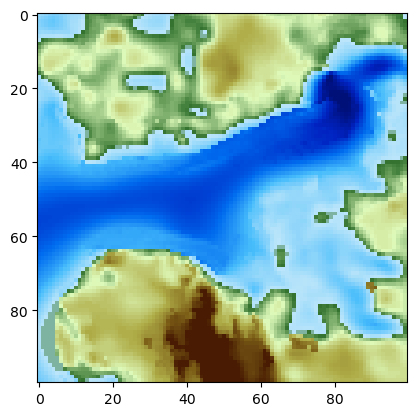

In [130]:
# Select bed topo channel
david_scene_tensor[0, 0].shape
# plt.imshow(david_scene_tensor[0, 0], cmap = "terrain")
plt.imshow(david_scene_tensor[0, 0], cmap = bedmachine_cmap, vmin = -2000, vmax = 1000)

In [115]:
print(torch.min(david_scene_tensor[:, 0, :, :]))
print(torch.max(david_scene_tensor[:, 0, :, :]))

print(torch.min(david_scene_tensor[:, 1, :, :])) # surface
print(torch.max(david_scene_tensor[:, 1, :, :])) # surface

tensor(-2219.1875)
tensor(1362.4950)
tensor(0.)
tensor(1371.2220)


In [152]:
# Define direction of lightsource
ls = LightSource(azdeg = 220, altdeg = 45)

# 2D array of illumination values between 0-1, where 0 is completely in shadow and 1 is completely illuminated.
# illumination = ls.hillshade(np.array(scene_tensor[:, 0, :, :].squeeze()), vert_exag = 1, dx = 500, dy = 500)

# An (M, N, 4) array of floats ranging between 0-1, but last (4th) column is useless.
rgba = ls.shade(data = np.array(david_scene_tensor[:, 0, :, :].squeeze()), 
         cmap = bedmachine_cmap, 
         vmin = -2000, 
         vmax = 1000,
         # blend_mode = "overlay",
         # blend_mode = "hsv",
         blend_mode = "soft",
         vert_exag = 10, # 10 makes it more pronounces
         dx = 500, # 500 meters in x direction (between data points)
         dy = 500, # 500 meters in x direction
         )

# Project back to [0, 1] range and make int dtype
img = np.array((255 * rgba[:, :, :3]), int) 
fig = go.Figure(go.Image(z = img))
fig.show()

In [159]:
# Define direction of lightsource
ls = LightSource(azdeg = 220, altdeg = 45)

# 2D array of illumination values between 0-1, where 0 is completely in shadow and 1 is completely illuminated.
# illumination = ls.hillshade(np.array(scene_tensor[:, 0, :, :].squeeze()), vert_exag = 1, dx = 500, dy = 500)

# An (M, N, 4) array of floats ranging between 0-1, but last (4th) column is useless.
rgba = ls.shade(data = np.array(david_scene_tensor[:, 0, :, :].squeeze()), 
         cmap = plt.get_cmap('coolwarm'),
         # cmap = plt.get_cmap('gist_earth'),
         # cmap = plt.get_cmap('terrain'),
         blend_mode = "overlay",
         vert_exag = 1, 
         dx = 500, 
         dy = 500,
         vmax = 30000
         )

# Discretise to images
img = np.array((255 * rgba[:, :, :3]), int)
fig = go.Figure(go.Image(z = img))
fig.show()

In [156]:
# Define direction of lightsource
ls = LightSource(azdeg = 220, altdeg = 45)

# 2D array of illumination values between 0-1, where 0 is completely in shadow and 1 is completely illuminated.
# illumination = ls.hillshade(np.array(scene_tensor[:, 0, :, :].squeeze()), vert_exag = 1, dx = 500, dy = 500)

# An (M, N, 4) array of floats ranging between 0-1, but last (4th) column is useless.
rgba = ls.shade(data = np.array(david_scene_tensor[:, 0, :, :].squeeze()), 
         # cmap = bedmachine_cmap,
         # cmap = plt.get_cmap('gist_earth'),
         cmap = plt.get_cmap('terrain'),
         blend_mode = "overlay",
         vert_exag = 100, 
         dx = 500, 
         dy = 500,
         )

# Discretise to images
img = np.array((255 * rgba[:, :, :3]) + 0.5, int)
fig = go.Figure(go.Image(z = img))
fig.show()

In [158]:
upscale = torch.nn.AvgPool2d(kernel_size = 4)
upscaled_tensor = upscale(david_scene_tensor[:, 0, :, :])

rgba_lr = ls.shade(data = np.array(upscaled_tensor.squeeze()), 
         cmap = plt.get_cmap('coolwarm'),
         blend_mode = "overlay",
         vert_exag = 1.00, 
         dx = 500, 
         dy = 500,
         vmax = 40000)

# Discretise to images
img_lr = np.array((255 * rgba_lr[:, :, :3]), int)
fig = go.Figure(go.Image(z = img_lr))
fig.show()

In [160]:
intro_continuous_scale = [[0, '#021999'], [0.25, '#3450ed'], [0.5, '#697ffa'], [0.75, '#9aa9fc'], [1, '#c4cdff']]

px.imshow(upscaled_tensor.squeeze(),
          color_continuous_scale = intro_continuous_scale,
          zmin = -2000, zmax = 1500,
          labels = dict(x = "x index", y = "y index"),
          title = "Surface elevation of one East Antarctic scene, using z values only")

In [163]:
px.imshow(upscaled_tensor.squeeze(),
          color_continuous_scale = "ice",
          zmin = -2000, zmax = 1000,
          labels = dict(x = "x index", y = "y index"),
          title = "Surface elevation of one East Antarctic scene, using z values only")

In [15]:
intro_continuous_scale = [[0, '#021999'], [0.25, '#3450ed'], [0.5, '#697ffa'], [0.75, '#9aa9fc'], [1, '#c4cdff']]

px.imshow(byrd_scene_tensor[:, 0, :, :].squeeze(),
          color_continuous_scale = intro_continuous_scale,
          zmin = -2000, zmax = 1500,
          labels = dict(x = "x index", y = "y index"),
          title = "Surface elevation of one East Antarctic scene, using z values only")

# 3D visualisation with plotly go

We can also visualise for instance the surface topography in 3D using Plotly go.

Be careful when visualising the data by specifying the z values only. Because the defaults are different, we need to flip the y-axis of the tensor, to match the default representation. We also change the orientation of the x and y axis to have the x-y origin facing us.

In [16]:
# !! Not advised to visualise data without x and y axis
# Flips ordering of y axis from high-to-low to low-to-high
fig = go.Figure(data = [go.Surface(z = torch.flip(scene_tensor[0, 1], dims = (0,)), 
                                   colorscale = "ice")])
fig.update_layout(height = 600, width = 800, template = "plotly_white")

# Optional: Change view angle
# fig.update_scenes(camera_eye_x = 1.25)
# fig.update_scenes(camera_eye_y = 1.25)
# fig.update_scenes(camera_eye_z = 1.5)

fig.update_scenes(xaxis_title_text = 'x index',  
                  yaxis_title_text = 'y index',  
                  zaxis_title_text = 'surface elevation')

# Change view
fig.update_scenes(xaxis_autorange = "reversed")
fig.update_scenes(yaxis_autorange = "reversed")

fig.show()

In [17]:
# Flipping not needed if we add the true x and y values as input.
fig = go.Figure(data = [go.Surface(z = scene_tensor[0, 1], x = scene_tensor[0, 3], y = scene_tensor[0, 2],
                                   colorscale = "ice")])
fig.update_layout(height = 600, width = 800, template = "plotly_white")

fig.update_scenes(xaxis_title_text = 'x coordinate',  
                  yaxis_title_text = 'y coordinate',  
                  zaxis_title_text = 'surface elevation')

# Reverse both axis to have x-y origin facing front corner
fig.update_scenes(xaxis_autorange = "reversed")
fig.update_scenes(yaxis_autorange = "reversed")

fig.show()

However, this visualisation heavily distorts the change in elevation. We actually only have a differance of ~ 90 m stetching across 50 x 50 km. The selected region is rather a plateau than a mountainous area. Let's find a more accurate representation, specifying the aspect ratio from the data, since x, y and z all have unit "meters".

In [18]:
# Flipping not needed if we add the true x and y values as input.
fig = go.Figure(data = [go.Surface(z = scene_tensor[0, 1], x = scene_tensor[0, 3], y = scene_tensor[0, 2], 
                                   colorscale = "ice")])
fig.update_layout(template = "plotly_white")

# Reverse both axis to have x-y origin facing front corner
fig.update_scenes(xaxis_autorange = "reversed")
fig.update_scenes(yaxis_autorange = "reversed")

fig.update_scenes(xaxis_title_text = 'x coordinate',  
                  yaxis_title_text = 'y coordinate',  
                  zaxis_title_text = 'z')

# Specify aspect ratio from data
fig.update_scenes(aspectmode = "data")

# Zoom out to displace full scene
fig.update_scenes(camera_eye_x = 8.0)
fig.update_scenes(camera_eye_y = 8.0)
fig.update_scenes(camera_eye_z = 8.0)

fig.show()

# Projections with Pyproj

Polar data typically comes in a projection format that is optimised for the poles. Equal-Area Scalable Earth (EASE) Grids (e.g. [epsg:6933](https://epsg.io/6933)), Polar Stereographic Projections [epsg:3031](https://epsg.io/3031) (for north and south) and Rotated Pole are the most common. BedMachine comes in WGS 84 / Antarctic Polar Stereographic. See [epsg:3031](https://epsg.io/3031) for more details.

For interoperability, we might need to integrate data with other source projections, or we might need to re-project our data input standard geo-referencing systems.

A great tool for sporadic conversions - without opening Python every time - is the [Polar Geospatial Centre (PGC) coordinate converter](https://www.pgc.umn.edu/apps/convert/).

Example:
- Open the [Wikipedia page](https://en.wikipedia.org/wiki/Dome_C) of your favourite Antarctic hub, e.g. Dome C. Click on `Coordinates` in the top right corner of the article.
- Get the Decimal Degrees (DD) of Dome C from [Wikipedia-geohack](https://geohack.toolforge.org/geohack.php?pagename=Dome_C&params=75.099780_S_123.332196_E_region:AQ_type:city), see 'Decimal' in the top right corner (order is lat, lon).
- Copy latitude, longitude values into tool and extract Y, X in WGS84 Antarctic Polar Stereographic.

Otherwise, we can use **pyproj** for projection and mapping tasks. Recall that a projection is a mapping between points (pairs of x-y coordinates) defined in a source coordinate reference system and points in a target reference system. We map from the Polar Stereographic projection to a regular Lon Lat projection in the following:

In [19]:
# Projection details are saved as attributes in the .nc file
print("Projection:", xr_bedmachine.attrs["Projection"])
print("Proj4 projection code:", xr_bedmachine.attrs["proj4"])

Projection: Polar Stereographic South (71S,0E)
Proj4 projection code: +init=epsg:3031


In [20]:
# This is how projections work. check through tool
polarstereo_to_lonlat = pyproj.Transformer.from_crs(crs_from = pyproj.CRS("epsg:3031"),  
                                                    crs_to = pyproj.CRS("epsg:4326"),
                                                    always_xy = True) # xy order convention

# Pass in x and y meshgrids to return lon and lat meshgrids
lon_array, lat_array = polarstereo_to_lonlat.transform(scene_tensor[0, 3], scene_tensor[0, 2])

# Print for first point
print("x y (polar stereo):", scene_tensor[0, 3, 0, 0].item(), scene_tensor[0, 2, 0, 0].item())
print("lon lat (DD):", np.round(lon_array[0, 0], 4), np.round(lat_array[0, 0], 4))

x y (polar stereo): 1034000.0 -552000.0
lon lat (DD): 118.0955 -79.2427


# Map visualisation with cartopy

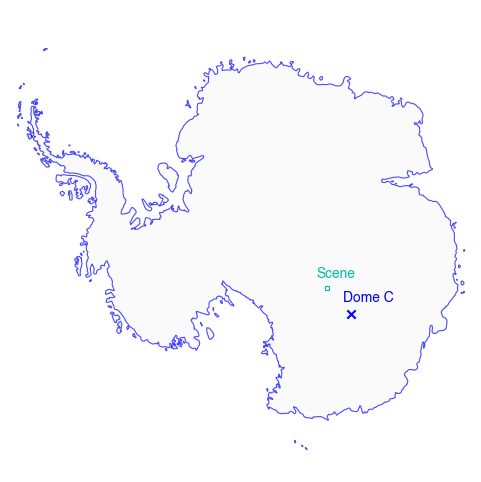

In [21]:
base_color = "#0000ff"
scene_color = "#00bf9f"
hfont = {'fontname':'Helvetica'}

# Initialise plot
fig = plt.figure(figsize = [6, 6])
ax = plt.axes(projection = ccrs.SouthPolarStereo())

# hides circular boundry line
ax.axis('off')

# restrict to lat < -65
ax.set_extent([- 180, 180, - 90, - 65], ccrs.PlateCarree())

# add grey land
ax.add_feature(cfeature.LAND, facecolor = ("#FAFAFA"), alpha = 1.0)

# thin coastline lines
ax.add_feature(cfeature.COASTLINE, edgecolor = base_color, linestyle = '-', linewidth = 0.8, alpha = 0.7)

# Add rectable for scene
ax.add_patch(mpatches.Rectangle(xy = [scene_x_min, scene_y_min], 
                                width = scene_size, 
                                height = scene_size,
                                facecolor = 'none', edgecolor = scene_color, linewidth = 0.8,
                                transform = ccrs.SouthPolarStereo()))

# Add Scene label
plt.annotate("Scene", (scene_x_min - 100000, scene_y_min + 150000), **hfont, color = scene_color,
             transform = ccrs.SouthPolarStereo())

# Add Dome C marker
ax.scatter(1359993, - 894443, 
           color = base_color, marker = "x",
           transform = ccrs.SouthPolarStereo())

# Add Dome C label
plt.annotate("Dome C", (1359993 - 100000, - 894443 + 150000), **hfont, color = base_color,
             transform = ccrs.SouthPolarStereo())

plt.show()

## Reproducibility

In [22]:
# Python package versions used
%load_ext watermark
%watermark --python
%watermark --iversions

Python implementation: CPython
Python version       : 3.9.16
IPython version      : 8.10.0

xarray    : 2022.11.0
cartopy   : 0.21.1
plotly    : 5.13.1
watermark : 2.3.1
matplotlib: 3.6.3
numpy     : 1.23.5
torch     : 1.13.1
pyproj    : 3.4.1

